In [1]:
import os
import utils 
from processing import process_batch # , predict_label, crop_humans
from memory_profiler import profile
from concurrent.futures import ThreadPoolExecutor, as_completed
from config import ex
import torch
from torchvision import transforms
from time import sleep
from PIL import Image
import configg
import os
import numpy as np
import torch
import torchvision
import os
import configg
from PIL import Image
from time import sleep
from torchvision import transforms
from matplotlib import pyplot as plt

CLIP_processor = transforms.Compose([
    transforms.Resize((336,336), interpolation=configg.BICUBIC),
    transforms.CenterCrop((336,336)),
    transforms.Normalize((0.48145466, 0.4578275, 0.40821073), (0.26862954, 0.26130258, 0.27577711)),
])

def load_batch(batch, transform):
    """
    Function to prepare a batch of images for processing.
    
    Parameters:
    - batch: list, the list of image paths.
    - transform: torchvision.transforms.Compose, the transformation to apply to the images.
    
    Returns:
    - images: torch.Tensor, the batch of images.
    """
    assert isinstance(batch, list), "Batch must be a list of image paths."
    assert isinstance(batch[0], str), "Batch must be a list of image paths."

    # Load and transform images
    images = [transform(Image.open(image_path).convert("RGB")) for image_path in batch]
    images = torch.stack(images)
    
    return images

masked_human_plot = []

scraped_images_dir = configg.scraped_images_dir

subdirs = utils.get_valid_subdirs(scraped_images_dir)

assert len(subdirs) > 0, f"No valid subdirectories found in {scraped_images_dir}"

# Define the transform to convert images to tensors
transform = transforms.Compose([
    transforms.Resize((320, 320)),  # Resize images to a fixed size
    transforms.ToTensor()  # Convert images to tensors
])



/Users/ilerisoy/anaconda3/envs/pg/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Initializing YOLO model...


/Users/ilerisoy/anaconda3/envs/pg/lib/python3.8/site-packages/transformers/utils/deprecation.py:165: UserWarning: The following named arguments are not valid for `SegformerImageProcessor.__init__` and were ignored: 'feature_extractor_type'
  return func(*args, **kwargs)


In [7]:
def segment_clothes(images: torch.Tensor, SEGMENT_CLOTH_PROCESSOR, SEGMENT_CLOTH_MODEL):
    """
    Function to segment clothes from an image using a segmentation model.
    
    Parameters:
    - image: Image to segment clothes from (PIL Image)
    - SEGMENT_CLOTH_PROCESSOR: SegformerImageProcessor
    - SEGMENT_CLOTH_MODEL: SegformerForSemanticSegmentation
    
    Returns:
    - pred_seg: Segmented image
    """

    # image_tensors = torch.stack(images).to(configg.DEVICE)
    # images = images.to(configg.DEVICE)
    images.save(os.path.join("filtered_images", f"image_pil_{1}.png"))

    inputs = SEGMENT_CLOTH_PROCESSOR(images=images, return_tensors="pt").to(configg.DEVICE)
    outputs = SEGMENT_CLOTH_MODEL(**inputs)
    logits = outputs.logits
    upsampled_logits = torch.nn.functional.interpolate(
        logits, size=images.size[::-1], mode="bilinear", align_corners=False)
    pred_seg = upsampled_logits.argmax(dim=1)[0]
    mask = (pred_seg == 4) | (pred_seg == 5) | (pred_seg == 6) | (pred_seg == 7) | (pred_seg == 8) | (pred_seg == 16) | (pred_seg == 17)

    pred_seg[~mask] = 0
    pred_seg[mask] = 255
    return pred_seg

def segment_and_apply_mask(cropped_image: torch.Tensor, seg_processor, seg_model):
    """
    Function to segment clothes from a cropped image and apply a mask to filter out the background.
    
    Parameters:
    - cropped_image: Cropped image to segment and apply mask to (NumPy array)
    - seg_processor: SegformerImageProcessor
    - seg_model: SegformerForSemanticSegmentation
    
    Returns:
    - cropped_image_pil: Cropped image with mask applied (PIL Image)
    """
    cropped_image_np = np.array(cropped_image)
    cropped_image_np = (cropped_image_np.transpose(1, 2, 0)*255).astype(np.uint8)
    cropped_image_pil = Image.fromarray(cropped_image_np)
    segmented_image = segment_clothes(cropped_image_pil, seg_processor, seg_model)
    segmented_image = segmented_image.cpu().numpy().astype(np.uint8)
    segmented_image_3ch = np.stack([segmented_image] * 3, axis=-1)
    filtered_image_np = np.where(segmented_image_3ch == 255, np.array(cropped_image_pil), 0)
    coords = np.column_stack(np.where(segmented_image == 255))
    if coords.size > 0:
        y_min, x_min = coords.min(axis=0)
        y_max, x_max = coords.max(axis=0)
        cropped_image = filtered_image_np[y_min:y_max+1, x_min:x_max+1]

        # plot the cropped image
        # cropped_image_pil = Image.fromarray(cropped_image, mode='RGB')
        return cropped_image
    else:
        # cropped_image_pil = Image.fromarray(filtered_image_np, mode='RGB').convert("RGB")
        return filtered_image_np
    # return cropped_image_pil

def image_encoder(batch_element: list, CLIP_MODEL, CLIP_TRANSFORM: torchvision.transforms.Compose):

    # Check if the input is a list of images
    assert isinstance(batch_element, list), "Input must be a list of images."

    all_image_features = []

    transformed_images = [CLIP_processor(cropped_image) for cropped_image in batch_element]
    transformed_images = torch.stack(transformed_images)

    with torch.no_grad():
        image_features = CLIP_MODEL.encode_image(transformed_images.to(configg.DEVICE))
        all_image_features.append(image_features)

    # Concatenate all image features
    if all_image_features:
        all_image_features = torch.cat(all_image_features, dim=0)
    else:
        all_image_features = torch.zeros(1, 768, device=configg.DEVICE)

    # Free up memory
    image_features = image_features.to("cpu")
    del transformed_images, image_features
    if configg.DEVICE == "cuda":
        torch.cuda.empty_cache()
    elif configg.DEVICE == "mps":
        torch.mps.empty_cache()

    return all_image_features

def calculate_similarity(image_features: torch.Tensor, design_embeddings: list, k=5):
    image_features = image_features.cpu()
    similarities = [torch.nn.functional.cosine_similarity(image_features, t) for t in design_embeddings]
    similarities = torch.tensor(similarities)

    # Sort the similarities and design labels in descending order
    sorted_similarities, _ = torch.sort(similarities, descending=True)
    # sorted_design_labels = [design_labels[i] for i in sorted_indices]

    # Calculate the average similarity score for the top-k designs
    avg_similarity = sorted_similarities[:k].mean().item()

    del design_embeddings, similarities, sorted_similarities
    return avg_similarity # , sorted_similarities[:k], sorted_design_labels[:k]

Number of images: 5
AT INDEX: 0
BATCH: ['/Users/ilerisoy/Vlisco/ML-based-Image-Matching/data/scraped/test/Y.jpg', '/Users/ilerisoy/Vlisco/ML-based-Image-Matching/data/scraped/test/X.jpg', '/Users/ilerisoy/Vlisco/ML-based-Image-Matching/data/scraped/test/VL0H450_129.jp2', '/Users/ilerisoy/Vlisco/ML-based-Image-Matching/data/scraped/test/YY.jpg', '/Users/ilerisoy/Vlisco/ML-based-Image-Matching/data/scraped/test/VL08870_000.jp2']
Length of results: 5
Number of boxes detected in image 1: 8


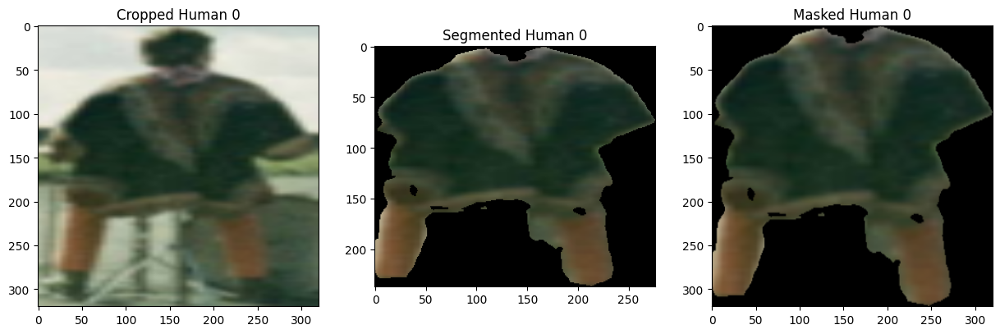

/var/folders/h2/0yz4qqt96pl7pfv1jmlkqfp40000gn/T/ipykernel_61879/3460918114.py:105: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  cropped_images.append(torch.tensor(masked_human))


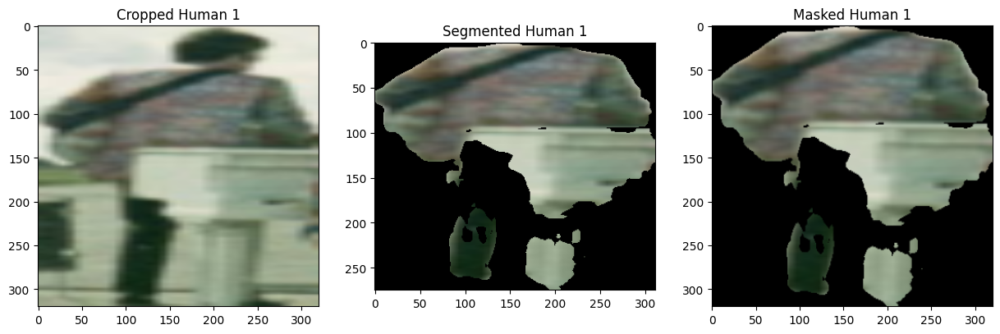

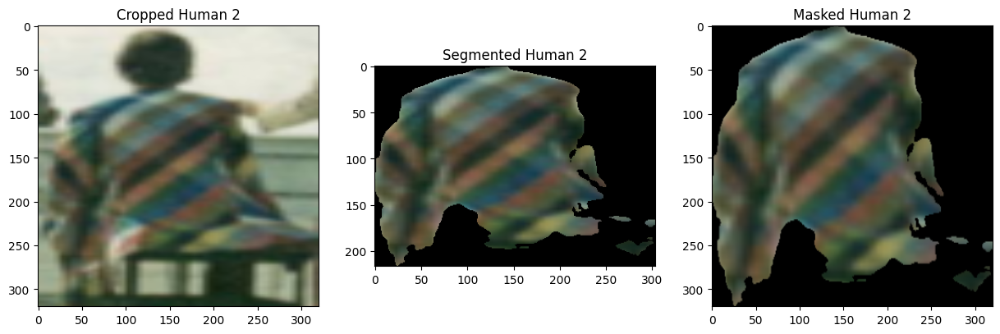

Skipping box 4 in image 1 as it is a handbag.


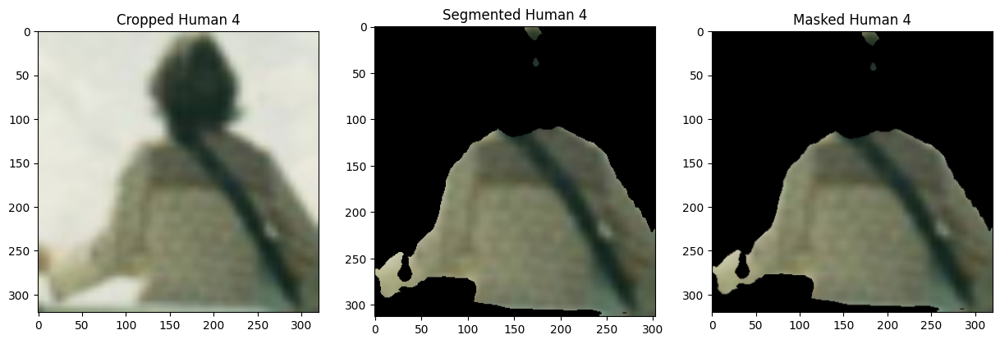

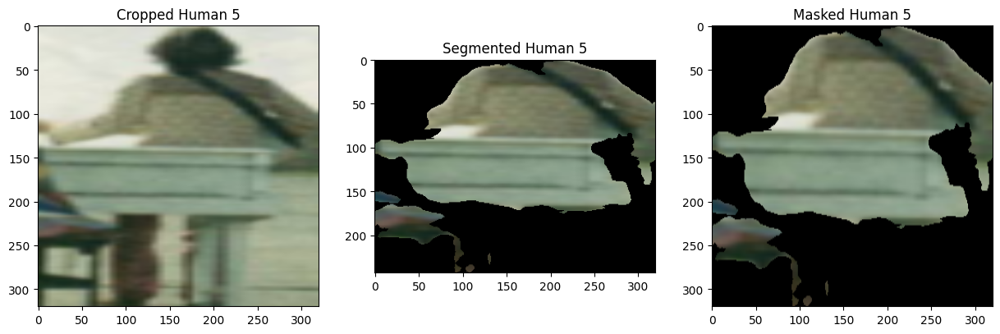

Skipping box 7 in image 1 as it is a suitcase.
Skipping box 8 in image 1 as it is a handbag.
Number of boxes detected in image 2: 8


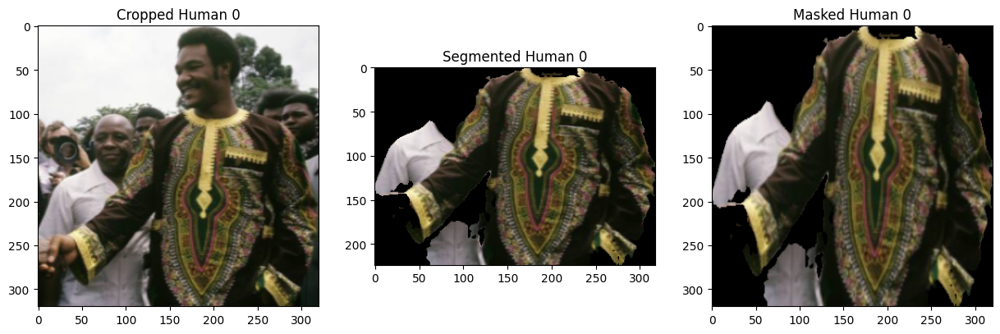

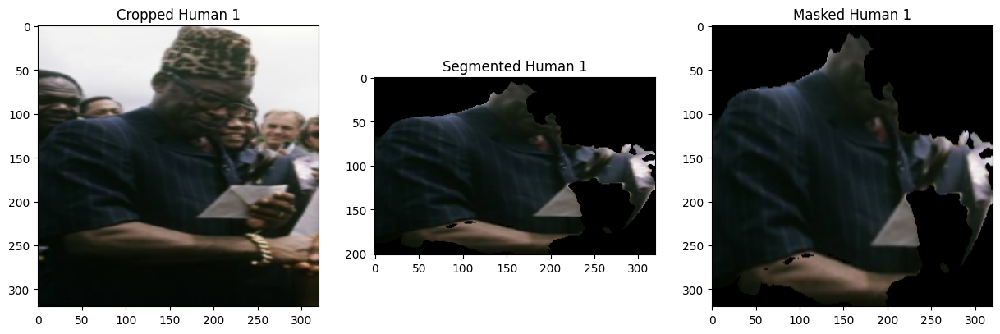

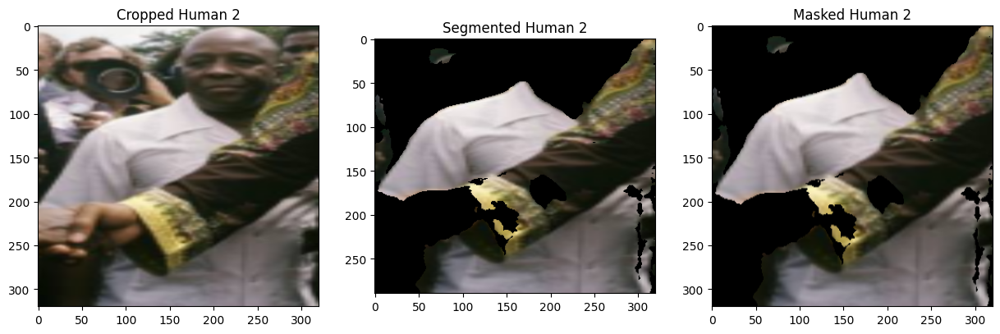

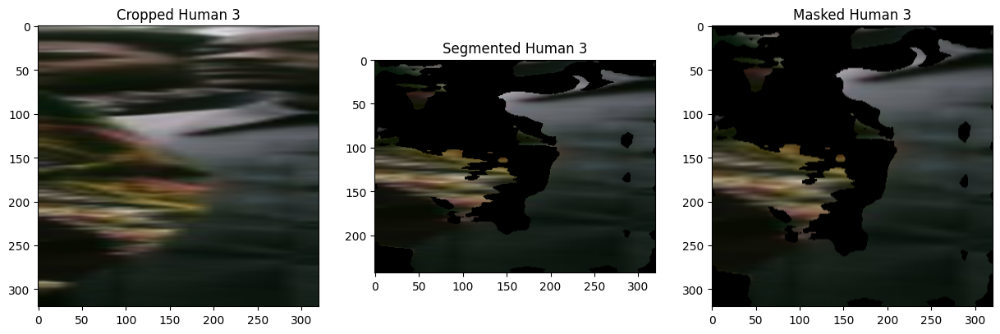

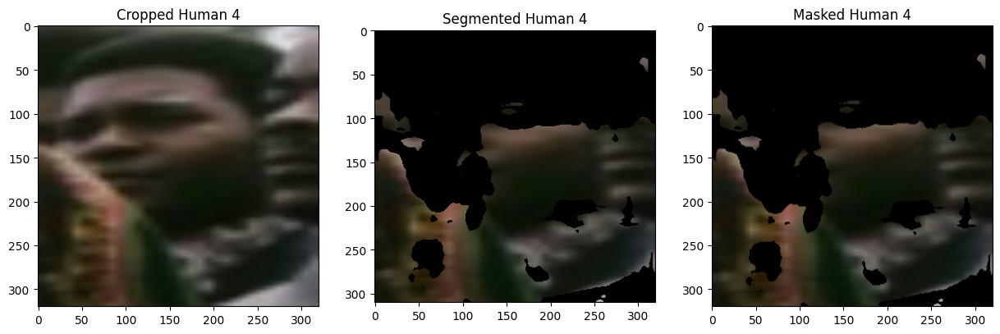

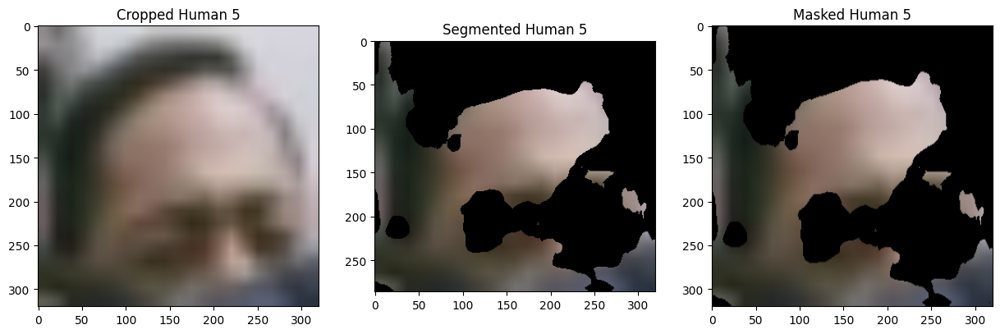

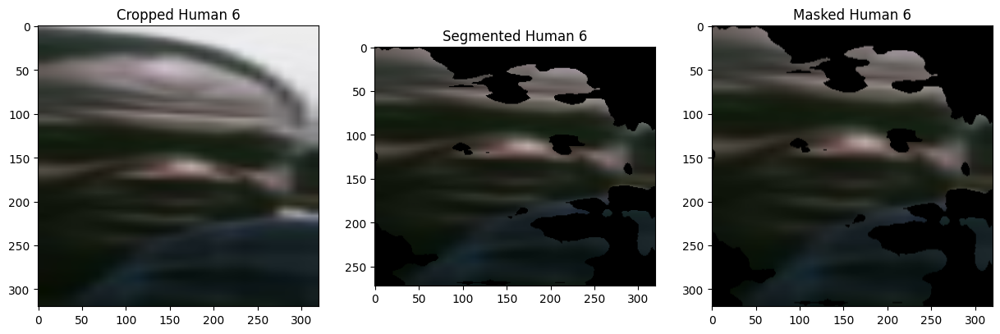

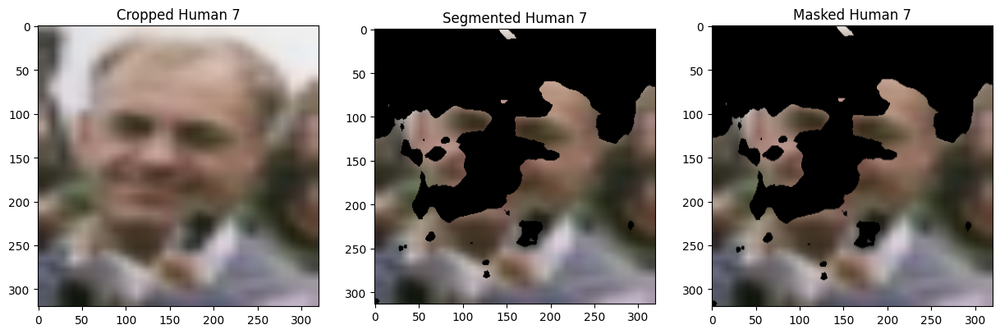

Number of boxes detected in image 3: 1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


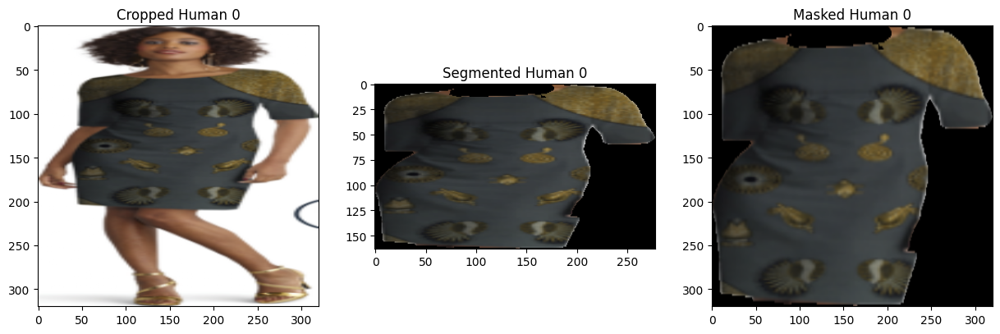

Number of boxes detected in image 4: 5


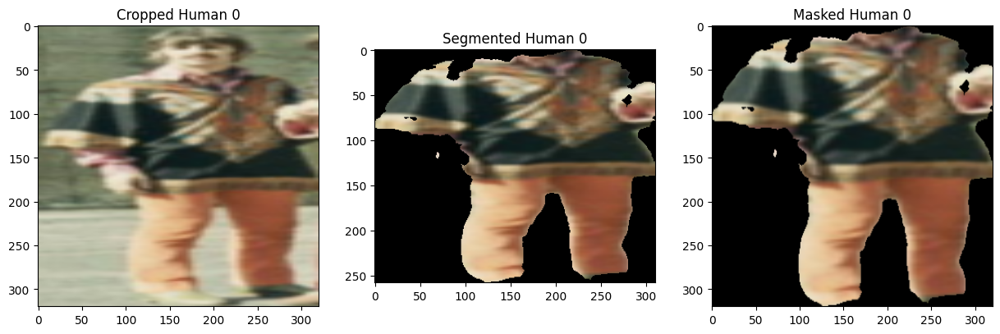

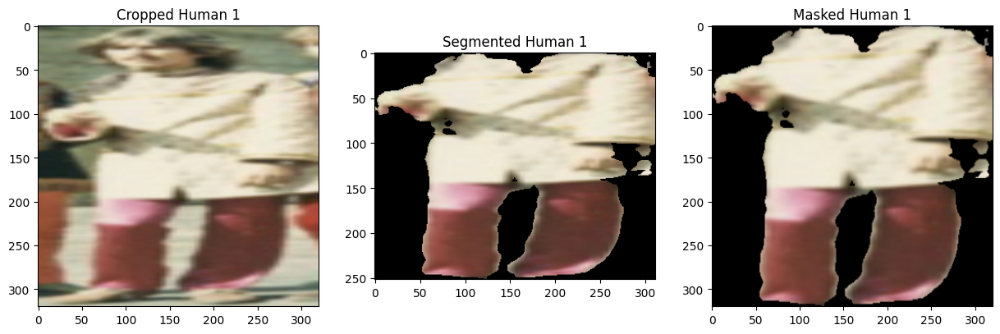

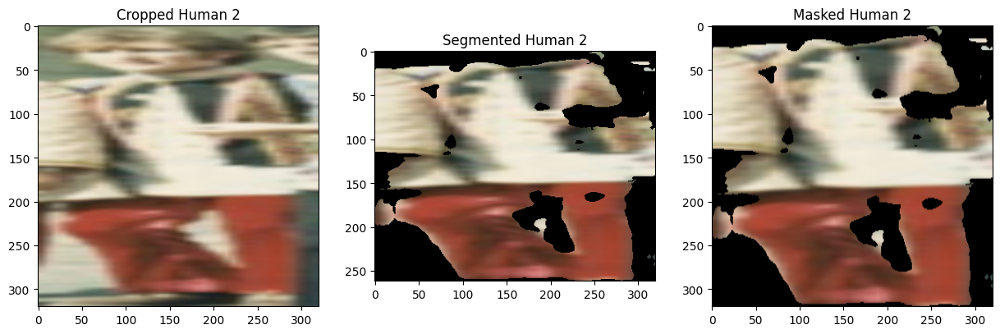

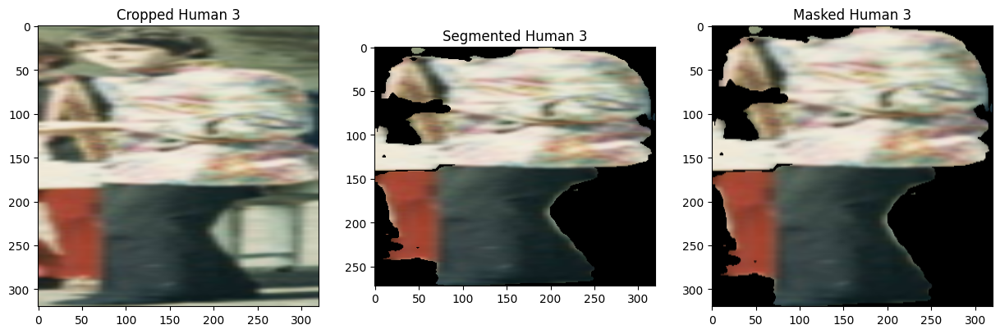

Skipping box 5 in image 4 as it is a backpack.
Number of boxes detected in image 5: 2


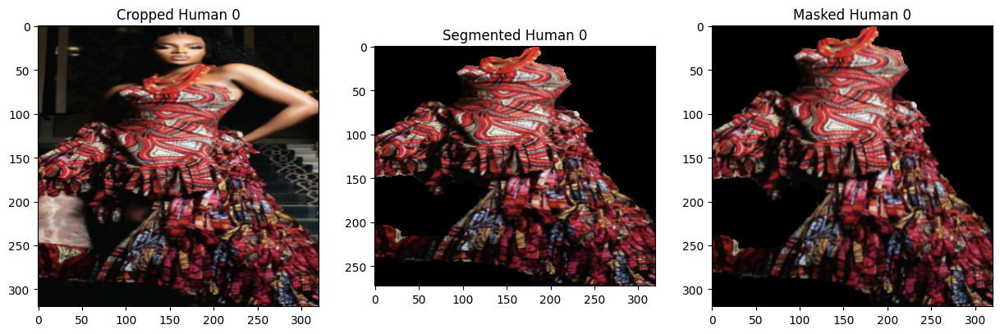

Skipping box 2 in image 5 as it is a bed.


In [ ]:
# for subdir in subdirs:
subdir = subdirs[0]
images_list = utils.get_images_in_directory(os.path.join(scraped_images_dir, subdir))
print(f"Number of images: {len(images_list)}")
images_list = utils.get_images_in_directory(os.path.join(configg.scraped_images_dir, subdir))
batch_size = configg.batch_size

labels = []
count = 0
for i in range(0, len(images_list), batch_size):
    count = count + 1
    batch = images_list[i:i+batch_size]

    print(f"AT INDEX: {i}\nBATCH: {batch}")

    # Load the batch of images
    batch = load_batch(batch, transform)

    # Assert the batch as a torch tensor
    assert isinstance(batch, torch.Tensor), "Batch must be a torch tensor."

    # Initialize the list of all cropped images
    cropped_images_list = []

    # Run inference on the batch
    results = configg.yolov8(batch.to(configg.DEVICE), verbose=False)
    print(f"Length of results: {len(results)}")

    # Process results list
    for idx, result in enumerate(results):
        print(f"Number of boxes detected in image {idx+1}: {len(result.boxes)}")
        boxes = result.boxes  # Boxes object for bounding box outputs
        masks = result.masks  # Masks object for mask outputs

        if masks is None:
            print(f"No masks detected for image {idx}.")
            cropped_images_list.append([torch.zeros((3, 320, 320), dtype=torch.float32)])
            continue
        
        cropped_images = []
        for i, box in enumerate(boxes):
            # Get the predicted class name
            class_id = int(box.cls[0])
            class_name = result.names[class_id]

            # Skip if the class is not a person
            if class_name != 'person':
                print(f"Skipping box {i+1} in image {idx+1} as it is a {class_name}.")
                continue

            # Get coordinates of the bounding box
            x1, y1, x2, y2 = map(int, box.xyxy[0])

            # Crop the masked image using the bounding box coordinates
            cropped_human = batch[idx, :, y1:y2, x1:x2]

            # Resize the cropped image to 320x320
            cropped_human = torch.nn.functional.interpolate(cropped_human.unsqueeze(0), size=(320, 320), mode="bilinear", align_corners=False).squeeze()

            # plt.imshow(cropped_human.permute(1, 2, 0).cpu())
            # plt.title(f"Cropped Human {i}")
            # plt.show()

            segmented_human = segment_and_apply_mask(cropped_human, configg.seg_processor, configg.seg_model)

            # #plot the masked_human
            # plt.imshow(segmented_human)
            # plt.title(f"Segmented Human {i}")
            # plt.show()

            # Reshape the cropped image to [Channel, H, W]
            masked_human = torch.tensor(segmented_human).permute(2, 0, 1)
            # Adjust the datatype
            masked_human = masked_human.to(torch.float32) / 255.0
            # Resize the cropped image to 320x320
            masked_human = torch.nn.functional.interpolate(masked_human.unsqueeze(0), size=(320, 320), mode="bilinear", align_corners=False).squeeze()

            # plt.imshow(masked_human.permute(1, 2, 0).cpu())
            # plt.title(f"Processed final Human {i}")
            # plt.show()


            # Plot the images in one row with three columns
            fig, axes = plt.subplots(1, 3, figsize=(15, 5))

            # Plot the cropped human
            axes[0].imshow(cropped_human.permute(1, 2, 0).cpu().numpy())
            axes[0].set_title(f"Cropped Human {i}")

            # Plot the masked human
            axes[1].imshow(segmented_human)
            axes[1].set_title(f"Segmented Human {i}")

            # Plot the segmented human
            axes[2].imshow(masked_human.permute(1, 2, 0).cpu().numpy())
            axes[2].set_title(f"Masked Human {i}")

            plt.show()

            # Append the cropped image to the list
            cropped_images.append(torch.tensor(masked_human))

    
        # Stack the of cropped images to the batch_cropped_images list
        if cropped_images == []:
            cropped_images.append(torch.zeros((3, 320, 320), dtype=torch.float32))
        cropped_images_list.append(cropped_images)

Average similarity: 0.6709109544754028


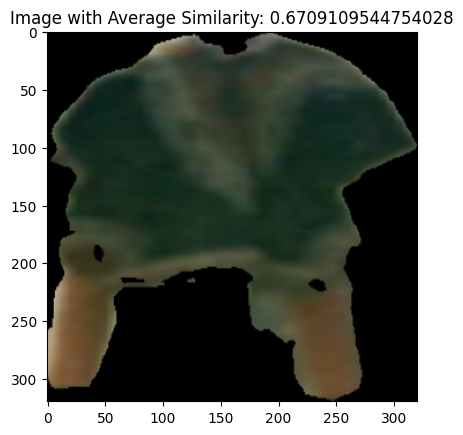

Average similarity: 0.6873470544815063


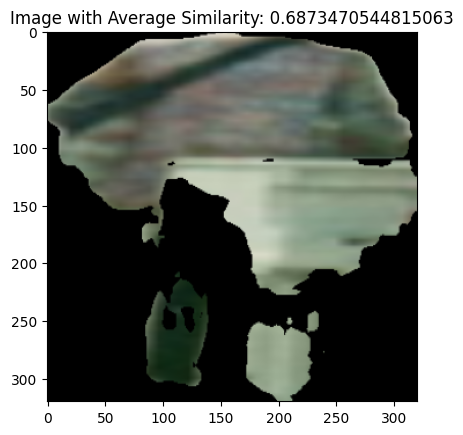

Average similarity: 0.7250284552574158


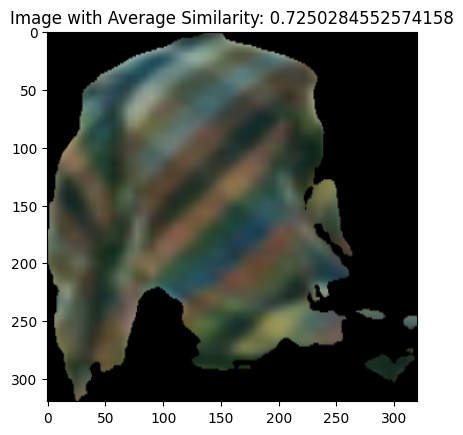

Average similarity: 0.7359527349472046


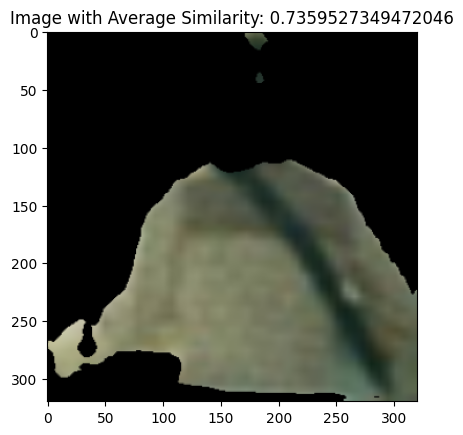

Average similarity: 0.6991493701934814


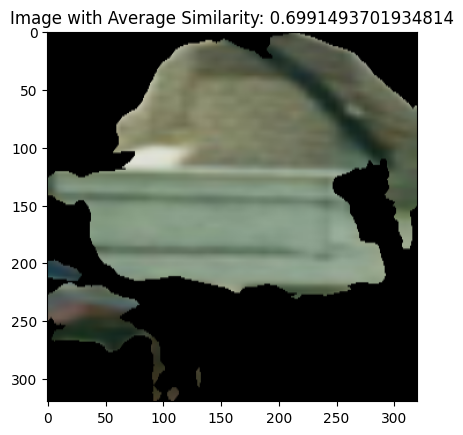

Average similarity: 0.6911969184875488


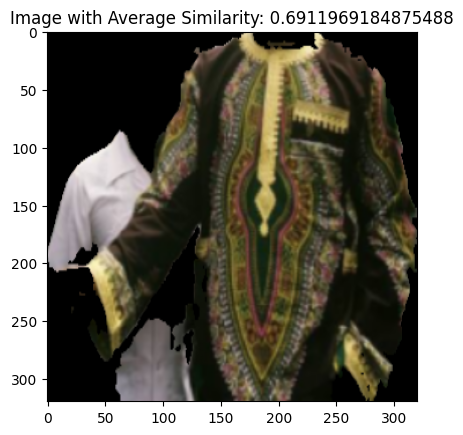

Average similarity: 0.6638481616973877


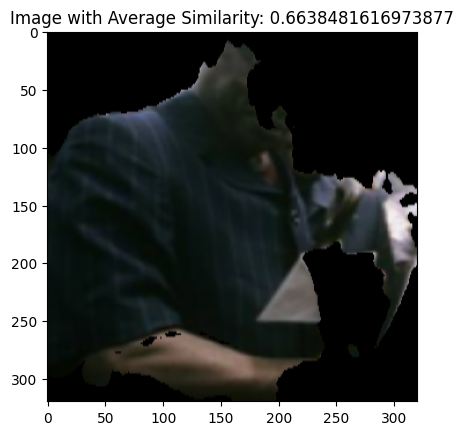

Average similarity: 0.7009708285331726


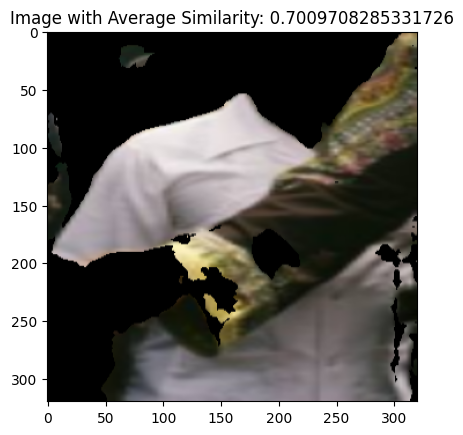

Average similarity: 0.7296320796012878


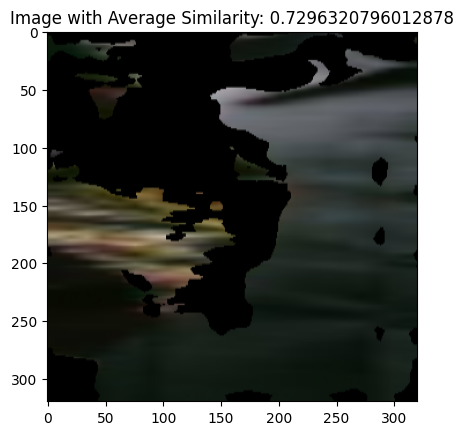

Average similarity: 0.7153715491294861


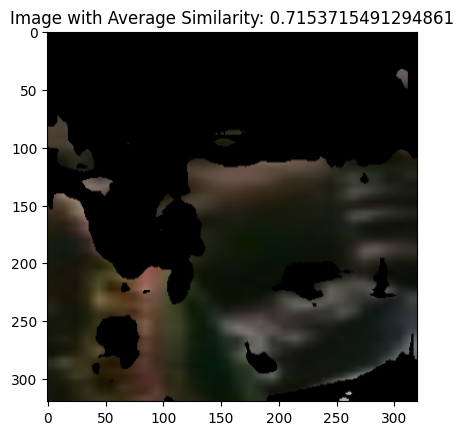

Average similarity: 0.6646962761878967


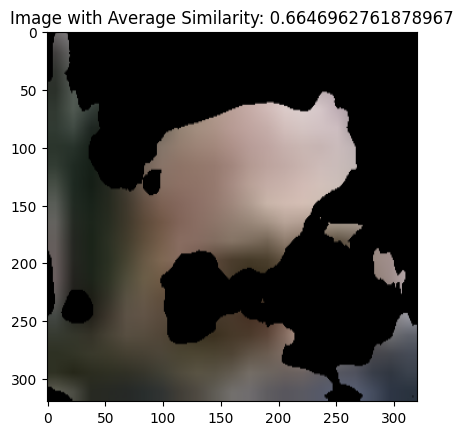

Average similarity: 0.6294537782669067


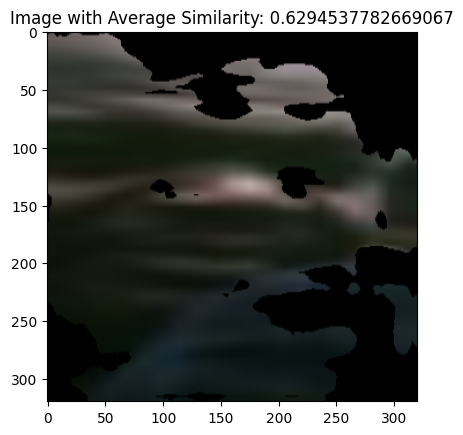

Average similarity: 0.6425898671150208


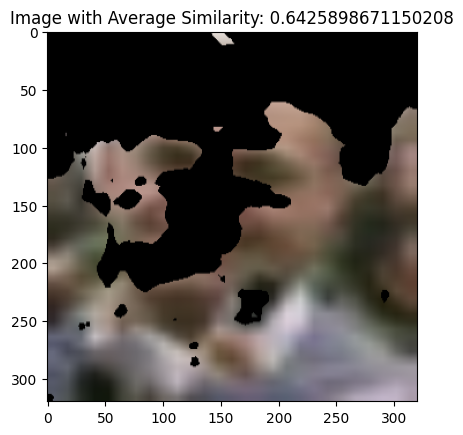

Average similarity: 0.6577547788619995


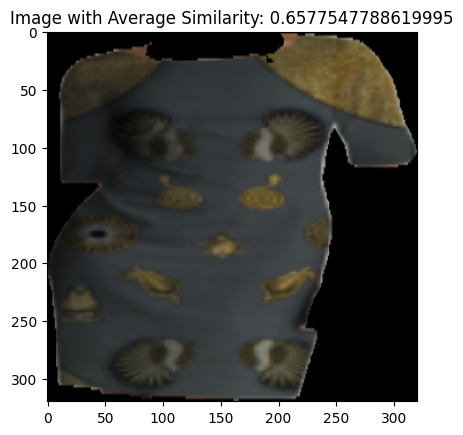

Average similarity: 0.6218420267105103


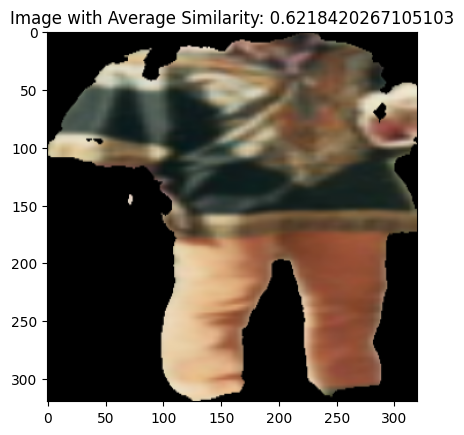

Average similarity: 0.6728903651237488


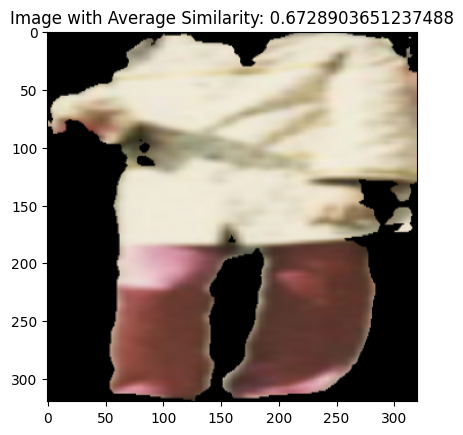

Average similarity: 0.7230140566825867


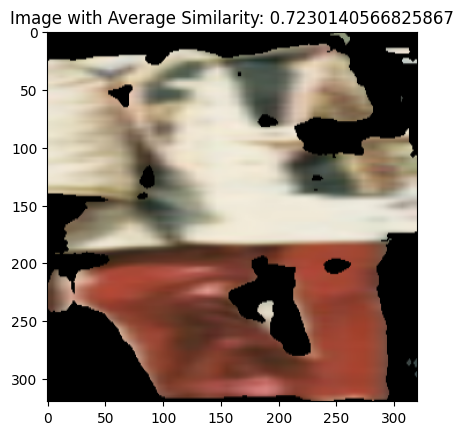

Average similarity: 0.6995049715042114


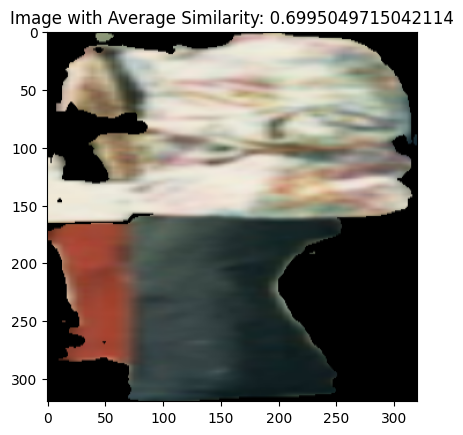

Average similarity: 0.7820385098457336


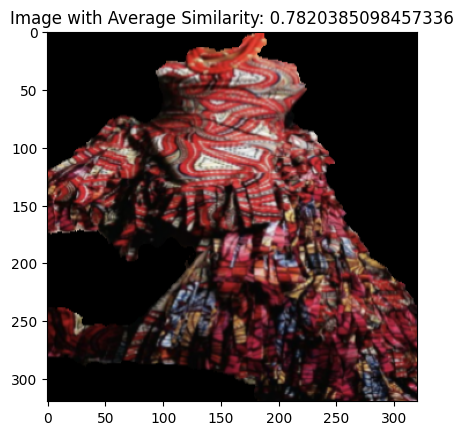

In [17]:
labels = []
for idx, batch_element in enumerate(cropped_images_list):
    if batch_element[0].sum() == 0:
            labels.append(False)
    else:
        # Encode the image
        image_features = image_encoder(batch_element, configg.CLIP_model, configg.CLIP_transform)
        # Compare the similarity
        for i, image in enumerate(image_features):
            avg_similarity = calculate_similarity(image, configg.design_embeddings)
            print(f"Average similarity: {avg_similarity}")

            # plot image and average similarity
            plt.imshow(batch_element[i].permute(1, 2, 0).cpu().numpy())
            plt.title(f"Image with Average Similarity: {avg_similarity}")
            plt.show()

            # Return a label if there is a match
            if avg_similarity >= configg.threshold:
                labels.append(True)
            else:
                labels.append(False)

In [ ]:
# Predict the labels
        labels = [predict_label(configg.threshold, element) for element in batch_cropped_images]

        del images, batch_cropped_images
        # Free up memory
        if configg.DEVICE == "cuda":
            torch.cuda.empty_cache()
        elif configg.DEVICE == "mps":
            torch.mps.empty_cache()
        
        return labels
        
        
        labels.extend(process_batch(batch, transform))
        
        
        
        
        # Free up memory
        if configg.DEVICE == "cuda":
            torch.cuda.empty_cache()
        elif configg.DEVICE == "mps":
            torch.mps.empty_cache()

        if count == 5:
            break
            raise SystemExit("Processed a single batch")
    
    for idx, label in enumerate(labels):
        if label:
            print(images_list[idx])